In [13]:
from datasets import load_dataset

train_image_dir = "../data/train/images/"
train_label_dir = "../data/train/labels/"
train_annotations_file = '../data/train_labels.json'
val_image_dir = "../data/valid/images/"
val_label_dir = "../data/valid/labels/"
test_annotations_file = '../data/test_labels.json'

# Replace 'path_to_your_images' and 'path_to_your_labels' with your actual paths
train_dataset = load_dataset('imagefolder', data_dir=train_image_dir)
train_labels = load_dataset('json', data_files=train_annotations_file)
#train_labels = load_dataset('imagefolder', data_dir=train_label_dir)

import datasets

train_combined = datasets.Dataset.from_dict({
    'image': train_dataset['image'], 
    'labels': train_labels
    })

Resolving data files:   0%|          | 0/878 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Failed to load JSON from file '/Users/kai/workspace/AAI501/data/train_labels.json' with error <class 'pyarrow.lib.ArrowInvalid'>: JSON parse error: Column() changed from object to string in row 0


DatasetGenerationError: An error occurred while generating the dataset

In [33]:
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import DetrImageProcessor, DetrForObjectDetection
from transformers import image_utils
from PIL import Image
import os
import numpy as np

class YoloDataset(Dataset):
    def __init__(self, image_folder, label_folder, processor):
        self.image_folder = image_folder
        self.label_folder = label_folder
        self.processor = processor
        self.image_filenames = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png'))]

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        image_filename = self.image_filenames[idx]
        image_path = os.path.join(self.image_folder, image_filename)
        label_path = os.path.join(self.label_folder, os.path.splitext(image_filename)[0] + '.txt')
        image = Image.open(image_path).convert("RGB")

        width, height = image.size
        boxes, class_ids = self.load_yolo_labels(label_path, width, height)

        annotations = []
        for idx, box in enumerate(boxes):
            label = class_ids[idx]
            annotations.append({
                'bbox': box, 
                'category_id': label, 
                'iscrowd': 0,
                'area': (box[2] - box[0]) * (box[3] - box[1]),
                })
        encoding = self.processor(images=image, annotations={'image_id': idx, 'annotations': annotations}, return_tensors="pt")
        pixel_values = encoding['pixel_values'].squeeze(0)
        target = {'boxes': encoding['labels'][0]['boxes'], 'labels': encoding['labels'][0]['class_labels']}
        return pixel_values, target

    def load_yolo_labels(self, label_path, width, height):
        boxes = []
        class_ids = []
        with open(label_path, 'r') as file:
            for line in file:
                parts = line.strip().split()
                class_id = int(parts[0])
                x_center, y_center, w, h = map(float, parts[1:])
                x_min = (x_center - w / 2) * width
                y_min = (y_center - h / 2) * height
                x_max = (x_center + w / 2) * width
                y_max = (y_center + h / 2) * height
                boxes.append([x_min, y_min, x_max, y_max])
                class_ids.append(class_id)
        return boxes, class_ids

image_folder = '../data/train/images'
label_folder = '../data/train/labels'
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_dataset = YoloDataset(image_folder, label_folder, processor)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: x)


In [1]:
import json
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import DetrImageProcessor, DetrForObjectDetection

class CocoDataset(Dataset):
    def __init__(self, image_folder, annotations_file, processor):
        self.image_folder = image_folder
        self.processor = processor
        with open(annotations_file, 'r') as f:
            self.coco = json.load(f)
        self.image_ids = [img['id'] for img in self.coco['images']]
        self.id_to_filename = {img['id']: img['file_name'] for img in self.coco['images']}
        self.id_to_ann = {ann['image_id']: [] for ann in self.coco['annotations']}
        for ann in self.coco['annotations']:
            self.id_to_ann[ann['image_id']].append(ann)

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        image_filename = self.id_to_filename[image_id]
        image_path = os.path.join(self.image_folder, image_filename)
        image = Image.open(image_path).convert("RGB")

        annotations = self.id_to_ann[image_id]
        boxes = [ann['bbox'] for ann in annotations]
        boxes = [[x, y, x + w, y + h] for x, y, w, h in boxes]  # Convert to [x_min, y_min, x_max, y_max] format
        class_ids = [ann['category_id'] for ann in annotations]
        
        annotations = []
        for idx, box in enumerate(boxes):
            label = class_ids[idx]
            annotations.append({
                'bbox': box, 
                'category_id': label, 
                'iscrowd': 0,
                'area': (box[2] - box[0]) * (box[3] - box[1]),
                })
        encoding = self.processor(images=image, annotations={'image_id': idx, 'annotations': annotations}, return_tensors="pt")
        # encoding = self.processor(images=image, annotations={'boxes': boxes, 'labels': class_ids}, return_tensors="pt")
        pixel_values = encoding['pixel_values'].squeeze(0)
        #target = {'boxes': encoding['labels'][0]['boxes'], 'labels': encoding['labels'][0]['labels']}
        target = {'boxes': encoding['labels'][0]['boxes'], 'labels': encoding['labels'][0]['class_labels']}

        return pixel_values, target

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_image_folder = '../data/train/images'
train_annotations_file = '../data/train_labels.json'
train_dataset = CocoDataset(train_image_folder, train_annotations_file, processor)
train_loader = DataLoader(train_dataset)

test_image_folder = '../data/test/images'
test_annotations_file = '../data/test_labels.json'
test_dataset = CocoDataset(test_image_folder, test_annotations_file, processor)
test_loader = DataLoader(test_dataset)

In [9]:
train_dataset[0]['img']

TypeError: tuple indices must be integers or slices, not str

In [6]:
from transformers import AdamW

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")
model.to(device)

optimizer = AdamW(model.parameters(), lr=1e-5)

from transformers import TrainingArguments, Trainer
import evaluate

metric = evaluate.load("accuracy")
label_names = ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

def train_one_epoch(model, train_dataset, eval_dataset, optimizer, device):
    training_args = TrainingArguments(
        output_dir="detr_trainer_output", 
        label_names=label_names,
        eval_strategy="epoch")
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        compute_metrics=compute_metrics,
    )

    return trainer.train()

num_epochs = 10
for epoch in range(num_epochs):
    loss = train_one_epoch(model, train_dataset, test_dataset, optimizer, device)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss}")

# Save the fine-tuned model
model.save_pretrained("model_detr.pth")


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


  0%|          | 0/330 [00:00<?, ?it/s]

TypeError: vars() argument must have __dict__ attribute

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


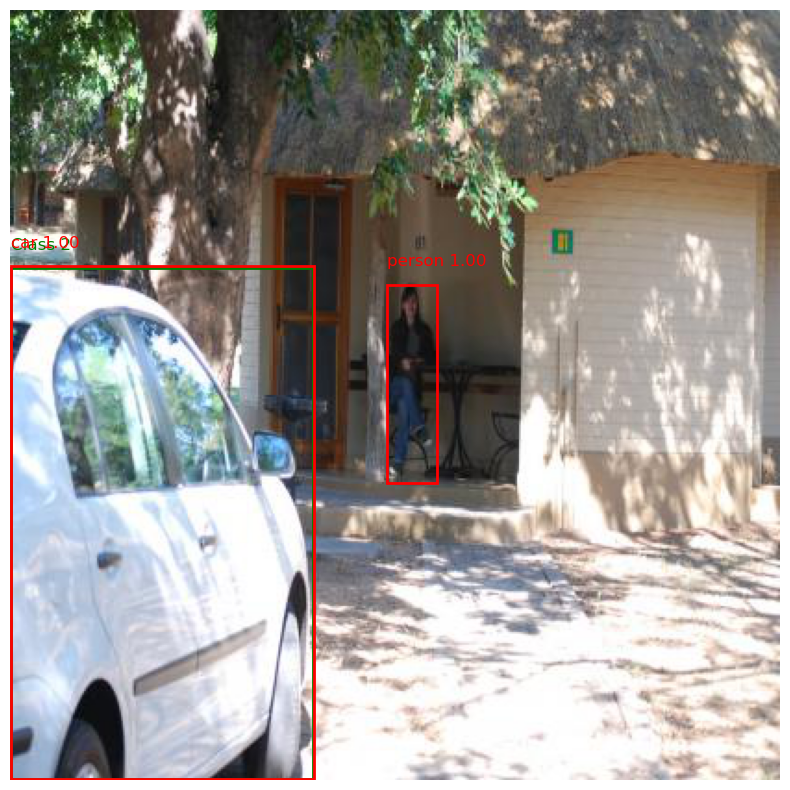

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


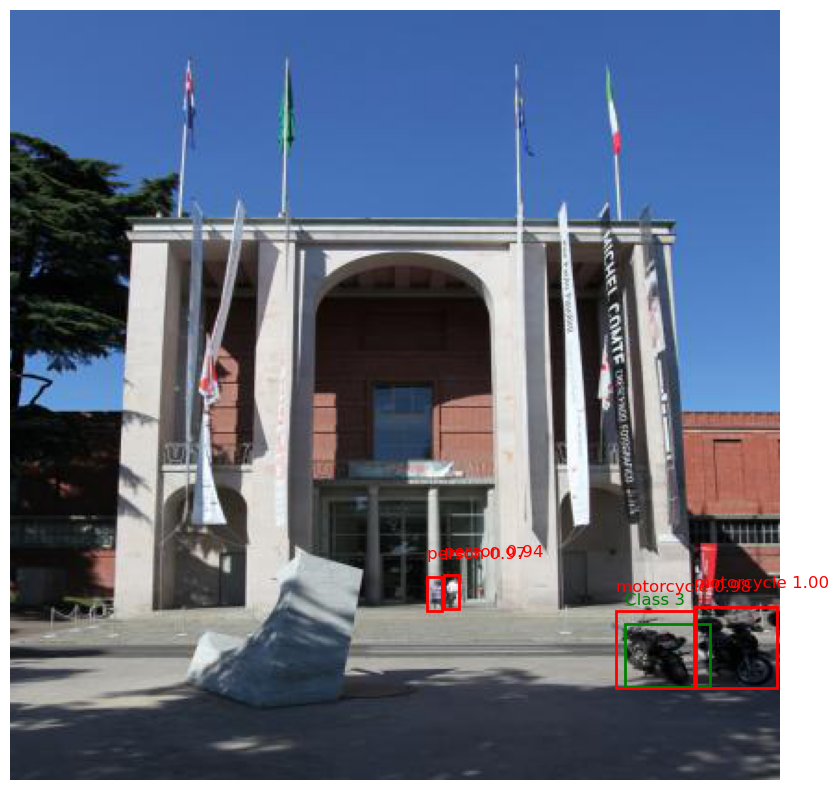

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


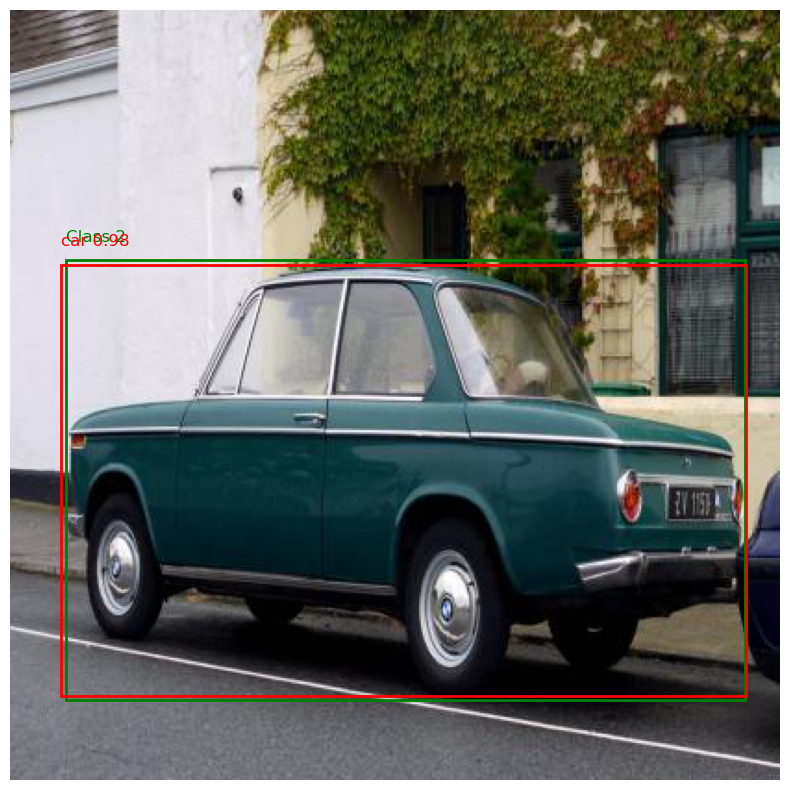

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


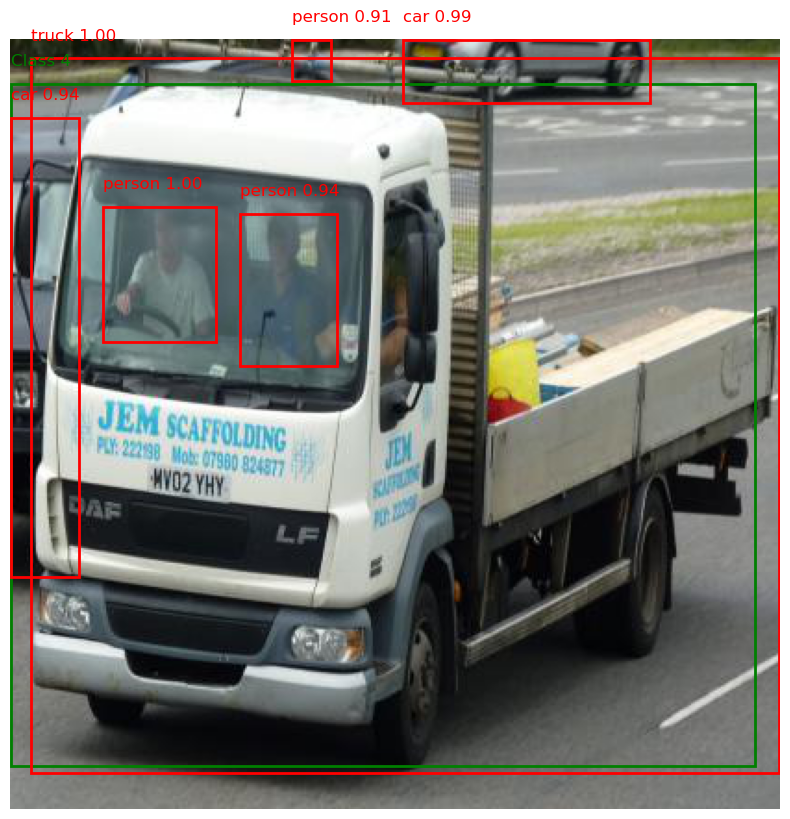

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


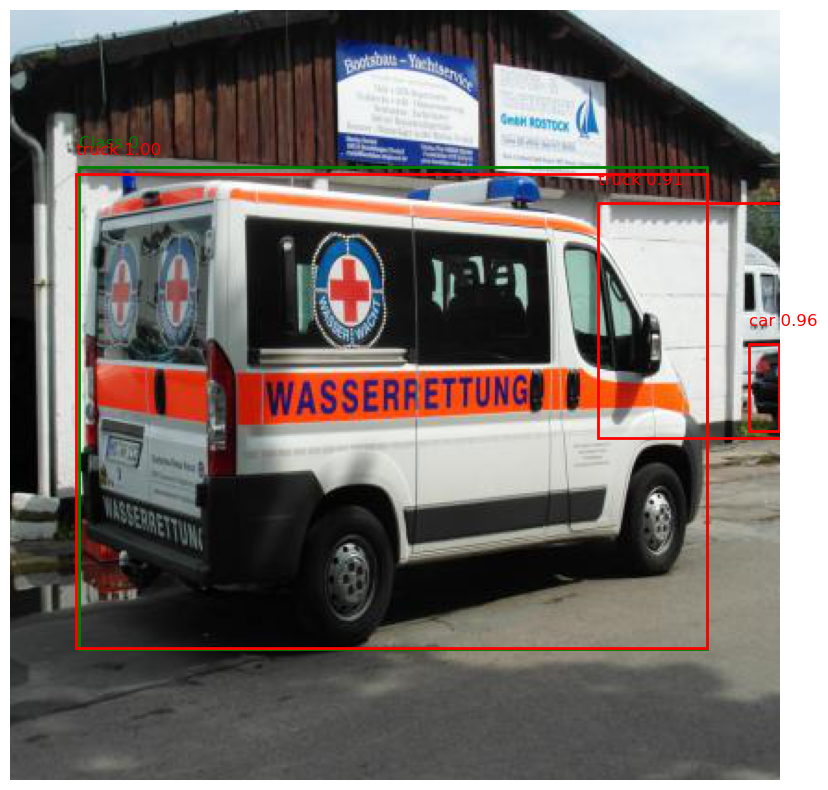

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


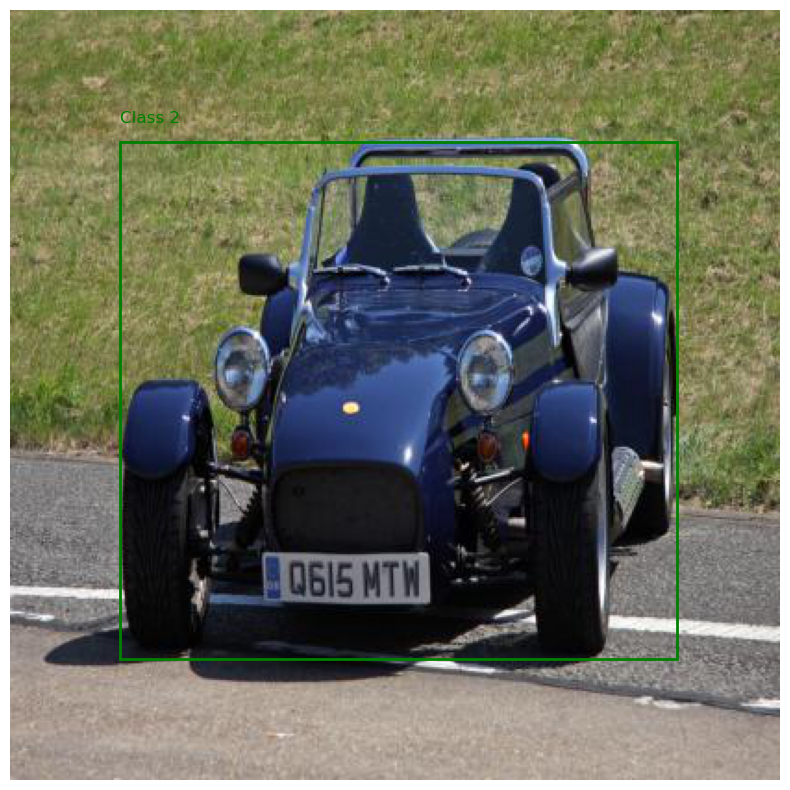

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


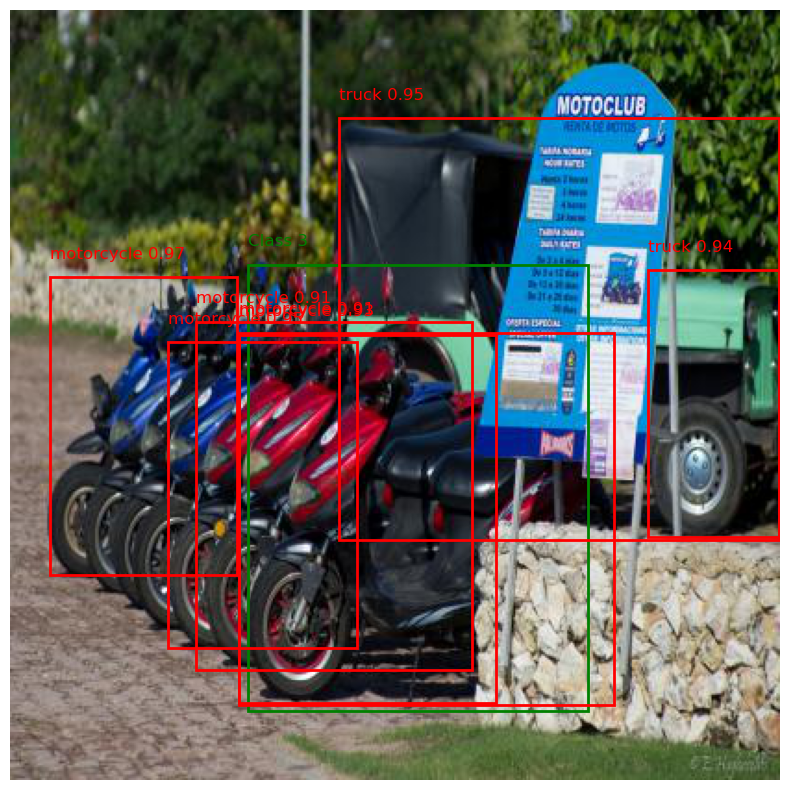

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


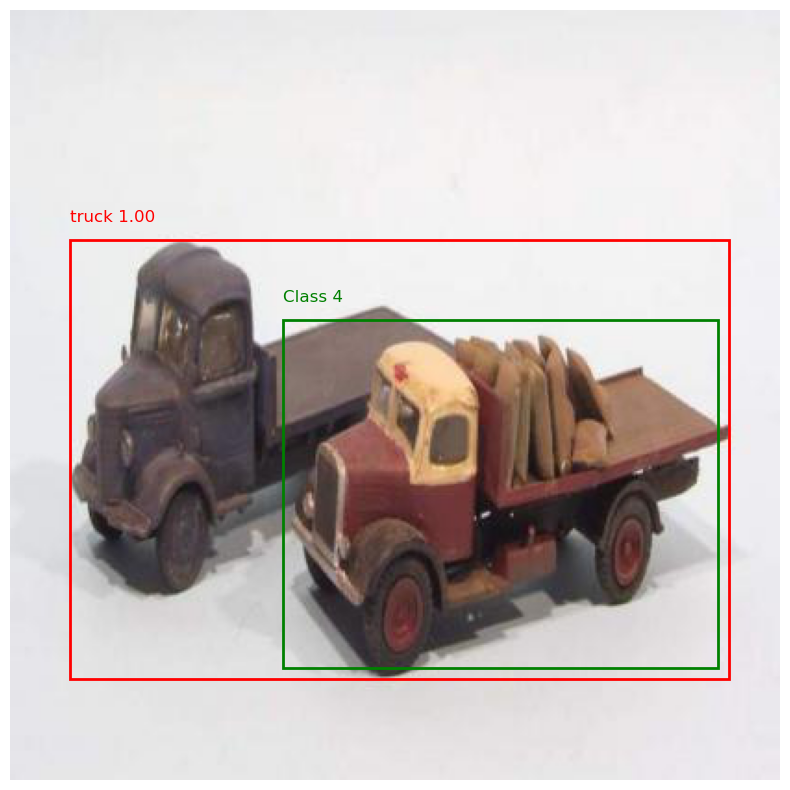

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


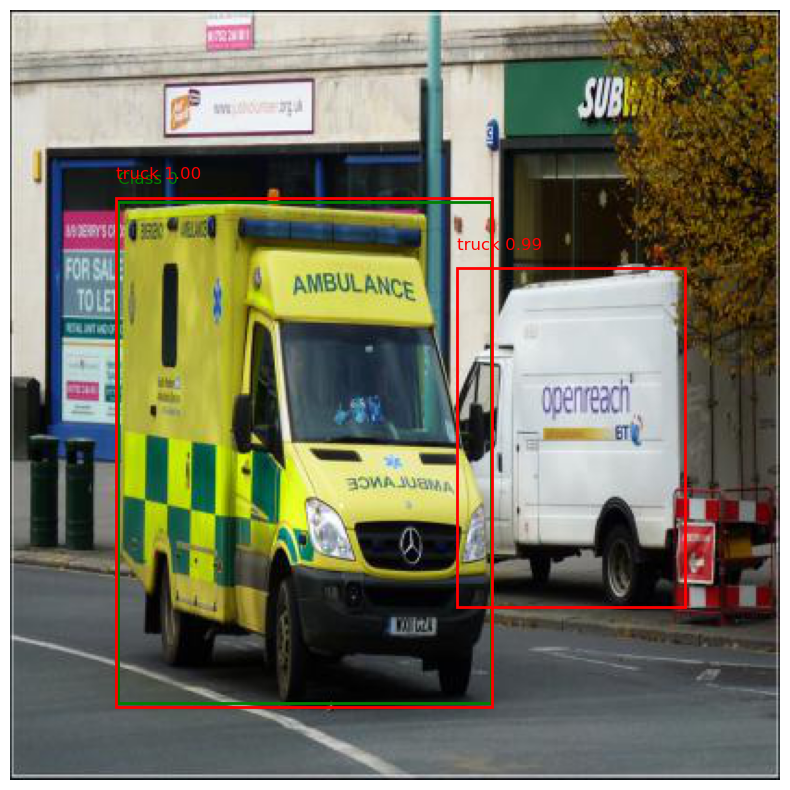

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


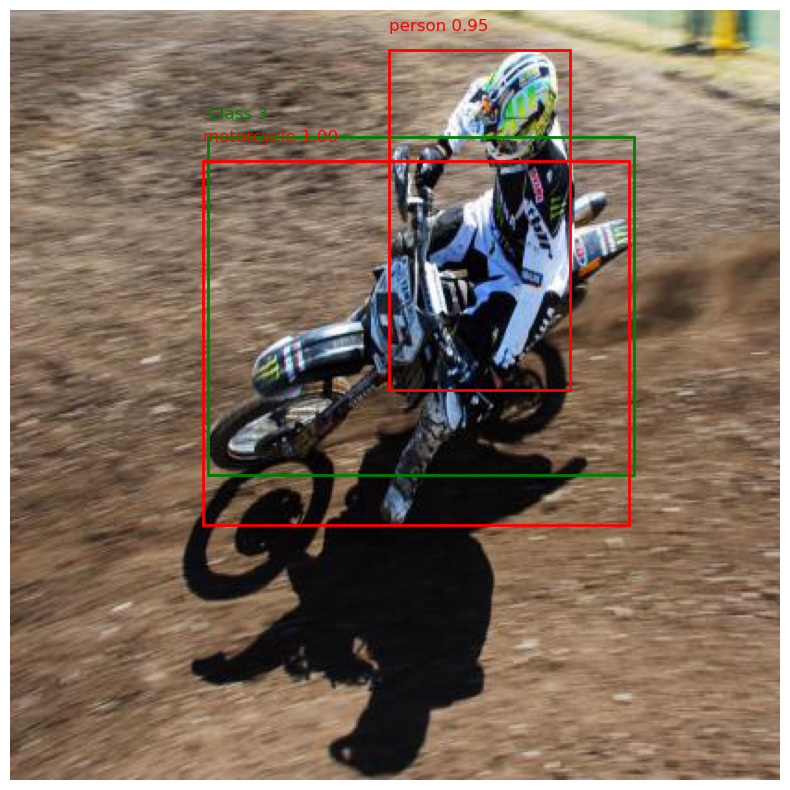

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


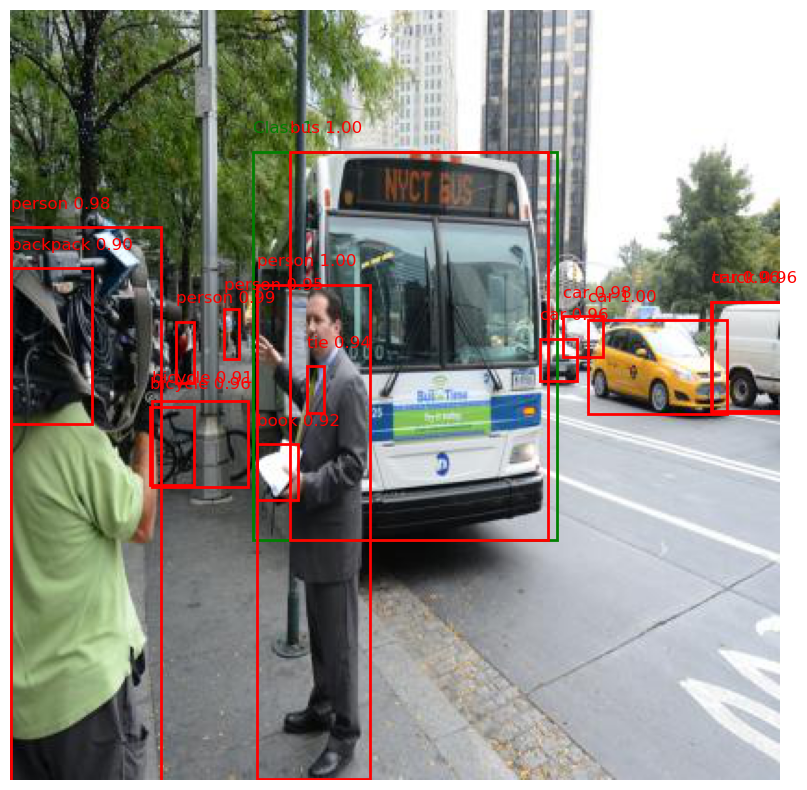

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


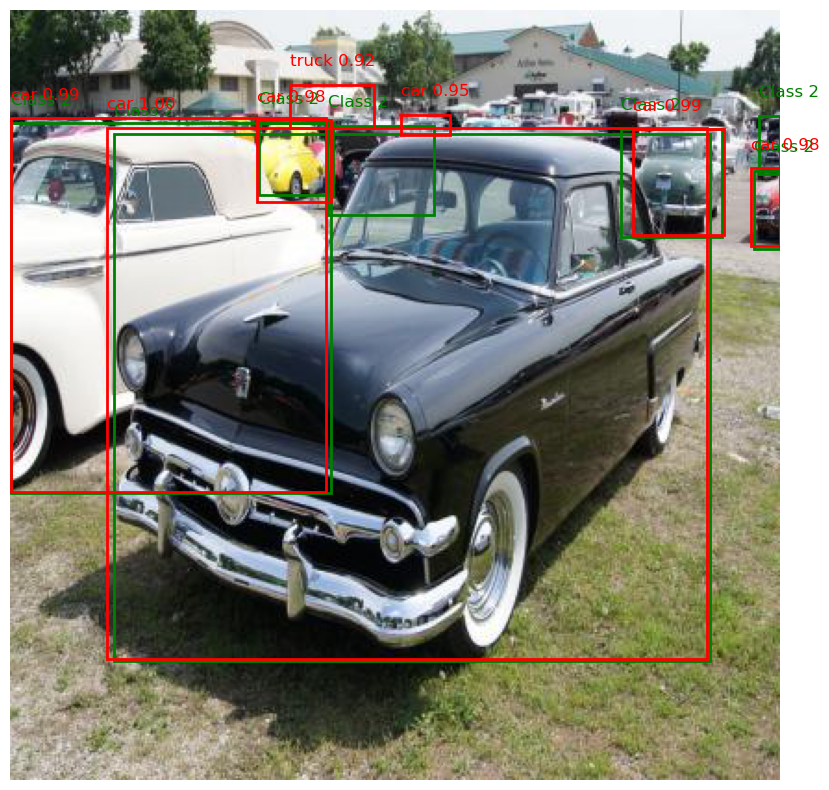

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


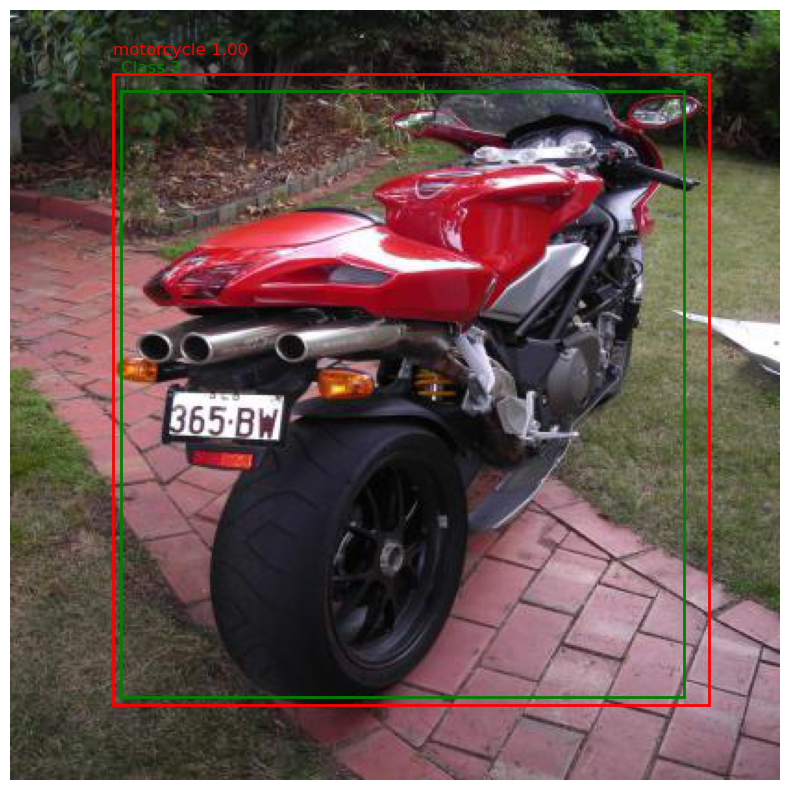

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


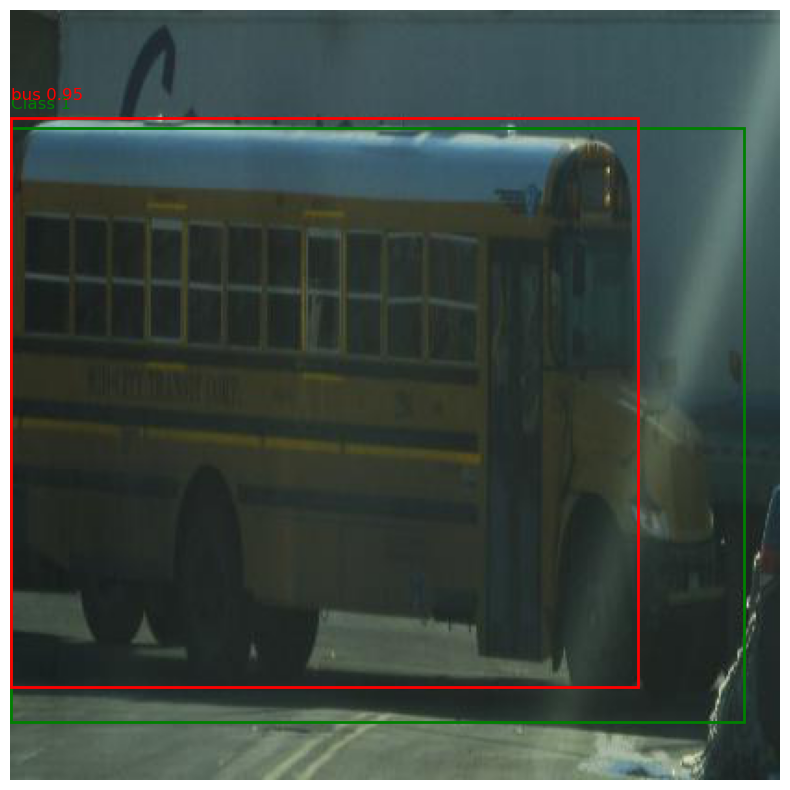

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


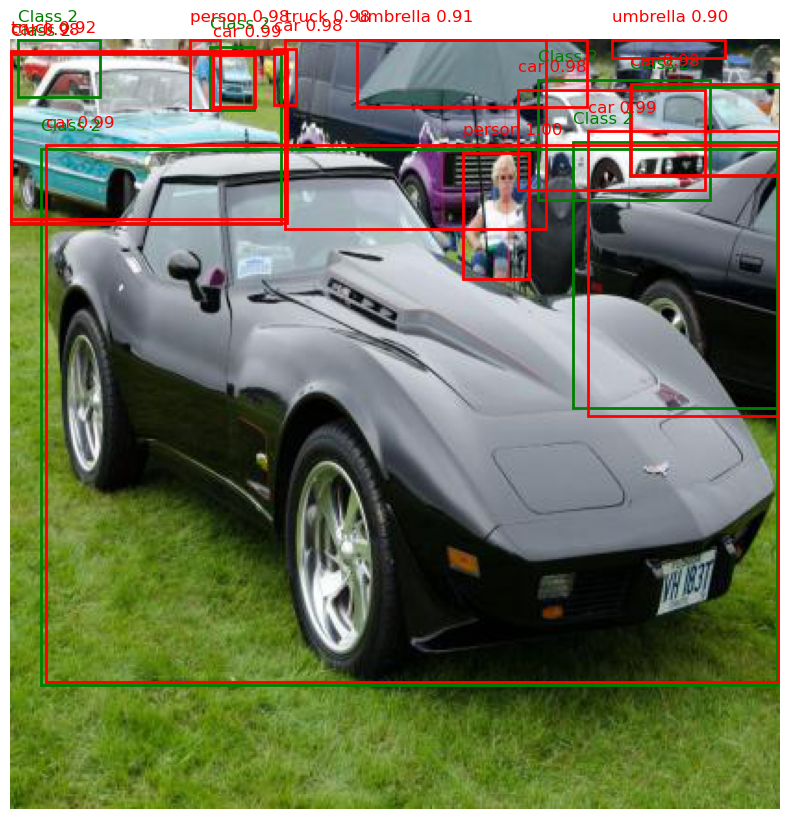

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


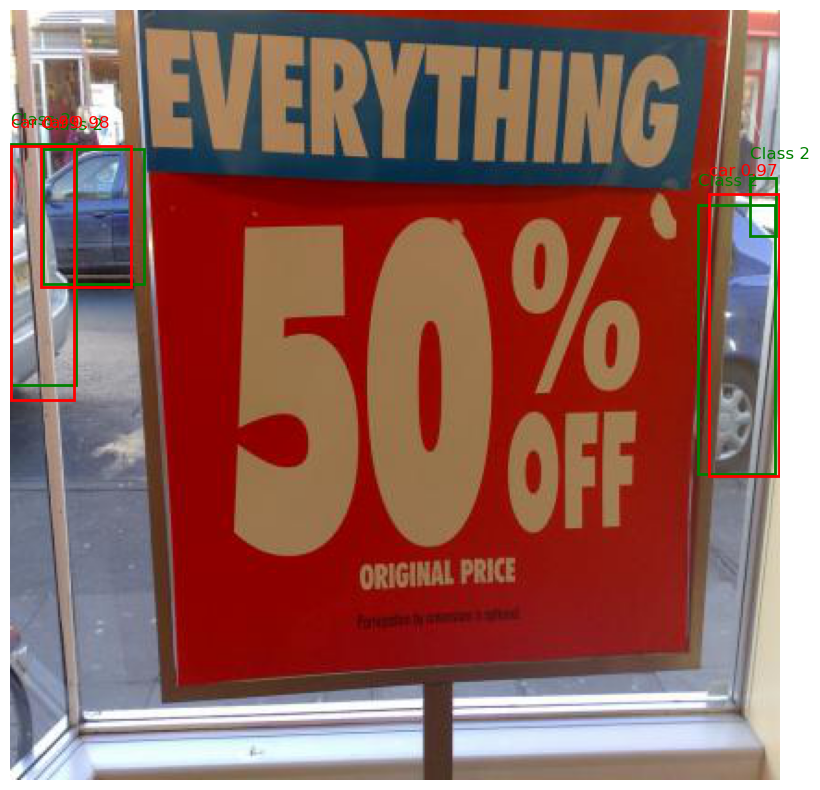

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


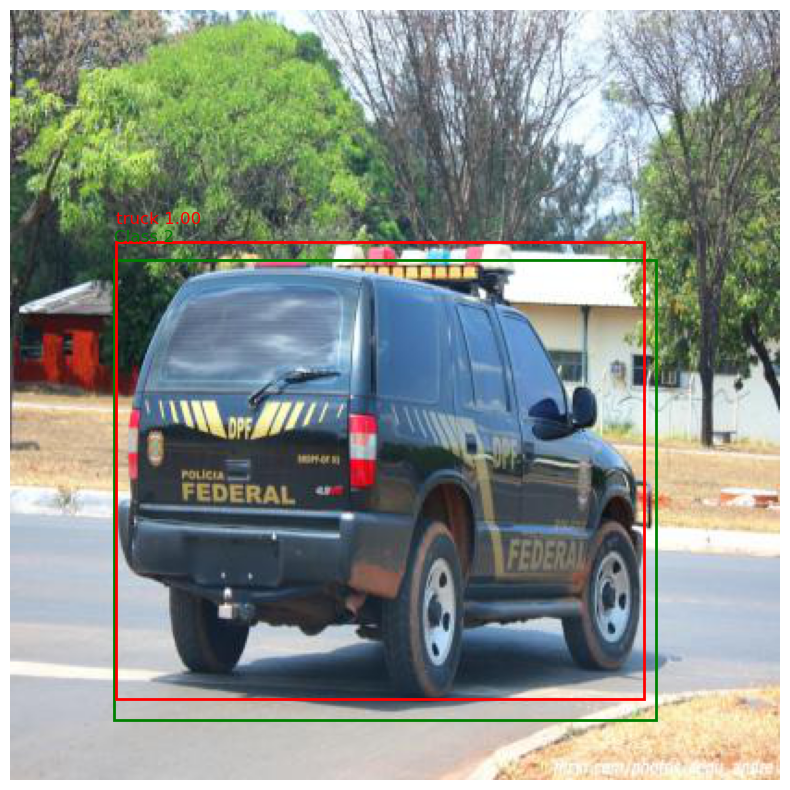

In [11]:
import torch
from transformers import DetrImageProcessor, DetrForObjectDetection
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import utils.utils as utils

def load_yolo_labels(label_path):
    boxes = []
    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
            boxes.append((class_id, x_center, y_center, width, height))
    return boxes

def denormalize_box(box, width, height):
    class_id, x_center, y_center, w, h = box
    x_center *= width
    y_center *= height
    w *= width
    h *= height
    x_min = x_center - w / 2
    y_min = y_center - h / 2
    x_max = x_center + w / 2
    y_max = y_center + h / 2
    return class_id, x_min, y_min, x_max, y_max

def detect_objects_with_detr(image_path, label_path):
    # Load pre-trained DETR model and processor
    processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
    model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

    # Load and preprocess the image
    image = Image.open(image_path)
    inputs = processor(images=image, return_tensors="pt")

    # Perform object detection
    outputs = model(**inputs)
    target_sizes = torch.tensor([image.size[::-1]])
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes)[0]

    # Load YOLO labels
    yolo_boxes = load_yolo_labels(label_path)
    image_width, image_height = image.size
    yolo_boxes = [denormalize_box(box, image_width, image_height) for box in yolo_boxes]

    # Display the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()

    # Draw YOLO boxes
    for class_id, x_min, y_min, x_max, y_max in yolo_boxes:
        label = f"Class {class_id}"
        color = (0, 255, 0)
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='g', facecolor='none')
        ax.add_patch(rect)
        plt.text(x_min, y_min - 10, label, color='green', fontsize=12)

    # Draw DETR boxes
    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        if score > 0.9:
            box = box.int().tolist()
            class_label = model.config.id2label[label.item()]
            rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(box[0], box[1] - 10, f"{class_label} {score:.2f}", color='red', fontsize=12)

    plt.axis('off')
    plt.show()

# Example usage with a local dataset
image_folder = '../data/train/images'
label_folder = '../data/train/labels'

for image_filename in os.listdir(image_folder):
    if image_filename.endswith('.jpg') or image_filename.endswith('.png'):
        image_path = os.path.join(image_folder, image_filename)
        label_path = os.path.join(label_folder, os.path.splitext(image_filename)[0] + '.txt')
        detect_objects_with_detr(image_path, label_path)
